In [20]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os

# **Questão 1. SIFT (Scale Invariant Feature Transform)**

As partes 1-6 da questão estão dentro da função sittch_multiples_images

In [21]:
def stitch_multiple_images(image_paths, lowe_threshold=0.65, ransac_reproj_threshold=5.0, show=False, panoName=None):
    """
    Costura múltiplas imagens panorâmicas em sequência usando SIFT,
    correspondência de pontos (Flann), RANSAC e warping de perspectiva.
    Inclui refinamentos para lidar com desalinhamento e visualização de depuração.

    Args:
        image_paths (list): A list of paths to the images to be stitched.
                            Images should be in sequential order (e.g., left to right).
        lowe_threshold (float): Threshold for the Lowe's ratio test (between 0 and 1). Smaller values are stricter.
        ransac_reproj_threshold (float): Reprojection threshold for RANSAC.
                                        Controls how "close" points must be to be considered inliers.
    """

    if not image_paths or len(image_paths) < 2:
        print("At least two images are required to stitch a panorama.")
        return

    # Load the first image as the base panorama
    try:
        current_panorama_bgr = cv2.imread(image_paths[0])
        if current_panorama_bgr is None:
            raise FileNotFoundError(f"Image '{image_paths[0]}' not found.")
        current_panorama_rgb = cv2.cvtColor(current_panorama_bgr, cv2.COLOR_BGR2RGB) # For display
    except Exception as e:
        print(f"Error loading the first image: {e}")
        return

    if show:
        print(f"Starting stitching with base image: '{image_paths[0]}'")

    # Iterate over the remaining images to stitch to the current panorama
    for i in range(1, len(image_paths)):
        next_image_path = image_paths[i]
        if show:
            print(f"\nStitching '{next_image_path}' to the current panorama...")

        try:
            next_image_bgr = cv2.imread(next_image_path)
            if next_image_bgr is None:
                raise FileNotFoundError(f"Image '{next_image_path}' not found.")
            next_image_rgb = cv2.cvtColor(next_image_bgr, cv2.COLOR_BGR2RGB) # For display
        except Exception as e:
            print(f"Error loading image '{next_image_path}': {e}")
            continue # Skip to the next image if this one cannot be loaded

        max_dim = 1000
        if current_panorama_rgb.shape[0] > max_dim or current_panorama_rgb.shape[1] > max_dim:
            scale_factor = max_dim / max(current_panorama_rgb.shape[0], current_panorama_rgb.shape[1])
            current_panorama_rgb = cv2.resize(current_panorama_rgb, (int(current_panorama_rgb.shape[1] * scale_factor), int(current_panorama_rgb.shape[0] * scale_factor)))
            current_panorama_bgr = cv2.resize(current_panorama_bgr, (int(current_panorama_bgr.shape[1] * scale_factor), int(current_panorama_bgr.shape[0] * scale_factor)))

        if next_image_rgb.shape[0] > max_dim or next_image_rgb.shape[1] > max_dim:
            scale_factor = max_dim / max(next_image_rgb.shape[0], next_image_rgb.shape[1])
            next_image_rgb = cv2.resize(next_image_rgb, (int(next_image_rgb.shape[1] * scale_factor), int(next_image_rgb.shape[0] * scale_factor)))
            next_image_bgr = cv2.resize(next_image_bgr, (int(next_image_bgr.shape[1] * scale_factor), int(next_image_bgr.shape[0] * scale_factor)))

        # Convert to grayscale
        img1_gray = cv2.cvtColor(current_panorama_rgb, cv2.COLOR_RGB2GRAY)
        img2_gray = cv2.cvtColor(next_image_rgb, cv2.COLOR_RGB2GRAY)

        # 1. Use SIFT to detect keypoints and descriptors
        sift = cv2.SIFT_create()
        keypoints1, descriptors1 = sift.detectAndCompute(img1_gray, None)
        keypoints2, descriptors2 = sift.detectAndCompute(img2_gray, None)

        if show:
            print(f"  Keypoints in current panorama: {len(keypoints1)}")
            print(f"  Keypoints in next image: {len(keypoints2)}")

        # 4. Determine correspondences using FlannBasedMatcher
        FLANN_INDEX_KDTREE = 1
        index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=5)
        search_params = dict(checks=50)

        flann = cv2.FlannBasedMatcher(index_params, search_params)

        if descriptors1 is None or descriptors2 is None or len(descriptors1) == 0 or len(descriptors2) == 0:
            if show: print("  Not enough descriptors found for correspondence. Skipping this image.")
            continue

        matches = flann.knnMatch(descriptors1, descriptors2, k=2)

        good_matches = []
        for m, n in matches:
            if m.distance < lowe_threshold * n.distance:
                good_matches.append(m)

        if show:
            print(f"  Number of good matches found: {len(good_matches)}")

        if len(good_matches) > 0:
            img_matches_debug = cv2.drawMatches(current_panorama_bgr, keypoints1, next_image_bgr, keypoints2,
                                               good_matches, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
            if show:
                plt.figure(figsize=(15, 8))
                plt.imshow(cv2.cvtColor(img_matches_debug, cv2.COLOR_BGR2RGB))
                plt.title(f'Good Matches between Panorama and {next_image_path} (Step {i+1})')
                plt.axis('off')
                plt.show()

        # 5. Estimate the projective transformation H using RANSAC
        if len(good_matches) > 10: # Minimum points to estimate homography
            src_pts = np.float32([keypoints1[m.queryIdx].pt for m in good_matches]).reshape(-1, 1, 2)
            dst_pts = np.float32([keypoints2[m.trainIdx].pt for m in good_matches]).reshape(-1, 1, 2)

            H, mask = cv2.findHomography(dst_pts, src_pts, cv2.RANSAC, ransac_reproj_threshold)

            if H is None:
                print("  Could not estimate homography matrix. Skipping this image.")
                continue

            if show:
                print("  Estimated Homography Matrix (H) for this step:")
                print(H)

            # 6. Warp the next image and stitch it to the current panorama
            h1, w1 = current_panorama_rgb.shape[:2]
            h2, w2 = next_image_rgb.shape[:2]

            # Define the corners of the next image  
            pts = np.float32([[0, 0], [0, h2], [w2, h2], [w2, 0]]).reshape(-1, 1, 2)
            # Transform the corners of the next image using the homography
            dst_transformed_corners = cv2.perspectiveTransform(pts, H)

            # Find min/max x and y values to determine the total size
            min_x = int(min(dst_transformed_corners[:, 0, 0].min(), 0))
            max_x = int(max(dst_transformed_corners[:, 0, 0].max(), w1))
            min_y = int(min(dst_transformed_corners[:, 0, 1].min(), 0))
            max_y = int(max(dst_transformed_corners[:, 0, 1].max(), h1))

            stitched_width = max_x - min_x
            stitched_height = max_y - min_y

            # Create a translation matrix to adjust the position in the stitched image
            translation_matrix = np.array([[1, 0, -min_x],
                                           [0, 1, -min_y],
                                           [0, 0, 1]], dtype=np.float32)

            # Apply the translation to the homography matrix
            H_translated = translation_matrix @ H

            # 1. Warp the 'next_image' onto a new, larger canvas.
            warped_next_image = cv2.warpPerspective(next_image_rgb, H_translated, (stitched_width, stitched_height))

            # 2. Create a new panorama canvas, initially filled with zeros (black).
            new_panorama_rgb = np.zeros((stitched_height, stitched_width, 3), dtype=np.uint8)

            # 3. Place the 'current_panorama' onto this new canvas.
            target_y_start = max(0, -min_y)
            target_y_end = min(stitched_height, -min_y + h1)
            target_x_start = max(0, -min_x)
            target_x_end = min(stitched_width, -min_x + w1)

            # Calculate the source region from current_panorama_rgb (if clipping occurs)
            source_y_start = max(0, min_y)
            source_y_end = min(h1, stitched_height - (-min_y))
            source_x_start = max(0, min_x)
            source_x_end = min(w1, stitched_width - (-min_x))

            # Assign the current panorama to its position on the new canvas
            new_panorama_rgb[target_y_start:target_y_end, target_x_start:target_x_end] = \
                current_panorama_rgb[source_y_start:source_y_end, source_x_start:source_x_end]

            # 4. Overlay the warped 'next_image'.
            non_black_mask = np.any(warped_next_image != [0,0,0], axis=-1)
            new_panorama_rgb[non_black_mask] = warped_next_image[non_black_mask]


            current_panorama_rgb = new_panorama_rgb # The current panorama becomes the result of this stitch

            if show:
                plt.figure(figsize=(20, 10))
                plt.imshow(current_panorama_rgb)
                plt.title(f'Panorama After Stitching {next_image_path} (Step {i+1})')
                plt.axis('off')
                plt.show()

        else:
            print("  Insufficient good matches to estimate homography. Skipping this image.")
            continue

    # Save and display the final panorama
    if panoName != None:
        output_filename = f"imagensPanoramas\\{panoName}.jpg"
        cv2.imwrite(output_filename, cv2.cvtColor(current_panorama_rgb, cv2.COLOR_RGB2BGR)) # Save in BGR
        print(f"\nFinal stitched panorama saved as '{output_filename}'")

    if show:
        plt.figure(figsize=(20, 10))
        plt.imshow(current_panorama_rgb)
        plt.title('Final Stitched Panorama')
        plt.axis('off')
        plt.show()
    
    return current_panorama_rgb


In [22]:
def get_images(folder_path):
    """
    Retrieves the complete names and extensions of all image files
    within a given folder, regardless of their naming convention.

    Args:
        folder_path (str): The path to the folder containing the images.

    Returns:
        list: A list of complete file paths (including names and extensions) for all images.
              Returns an empty list if the folder does not exist or no images are found.
    """
    if not os.path.isdir(folder_path):
        print(f"Error: Folder '{folder_path}' does not exist.")
        return []

    image_files = []
    common_image_extensions = ('.png', '.jpg', '.jpeg', '.gif', '.bmp', '.tiff', '.webp', '.svg')

    for file_name in os.listdir(folder_path):
        if file_name.lower().endswith(common_image_extensions):
            full_path = os.path.join(folder_path, file_name)
            image_files.append(full_path)
    return image_files

Starting stitching with base image: 'wallpaper\1.png'

Stitching 'wallpaper\2.png' to the current panorama...
  Keypoints in current panorama: 55
  Keypoints in next image: 524
  Number of good matches found: 31


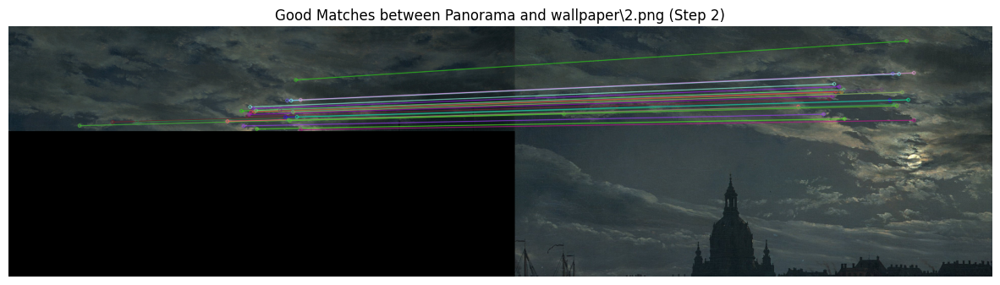

  Estimated Homography Matrix (H) for this step:
[[ 6.30871144e-01  5.53084233e-04  7.88302802e+01]
 [-3.77636024e-04  6.28882179e-01  8.74345411e+01]
 [-1.37291240e-06 -4.80955452e-07  1.00000000e+00]]


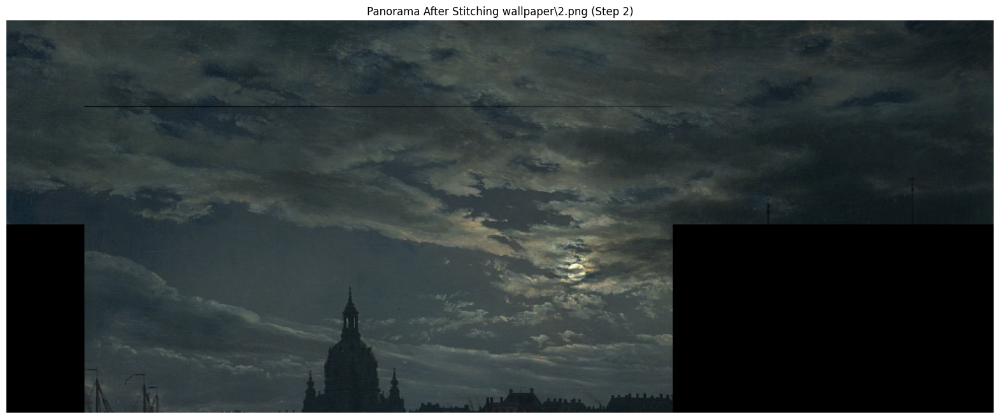


Stitching 'wallpaper\3.png' to the current panorama...
  Keypoints in current panorama: 289
  Keypoints in next image: 366
  Number of good matches found: 96


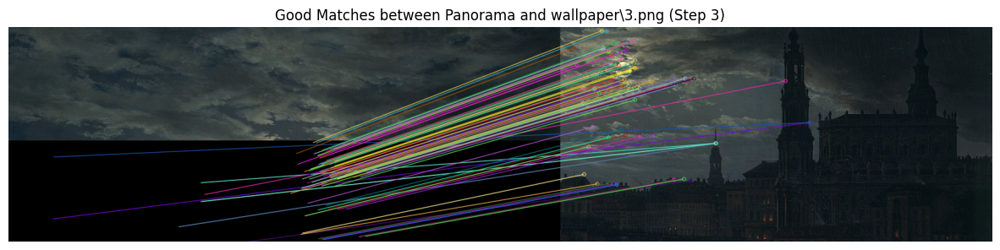

  Estimated Homography Matrix (H) for this step:
[[ 6.28178295e-01 -1.55208248e-03  5.04739032e+02]
 [-1.54809669e-03  6.27783774e-01  2.05752955e+02]
 [-6.13737610e-06 -4.52956658e-06  1.00000000e+00]]


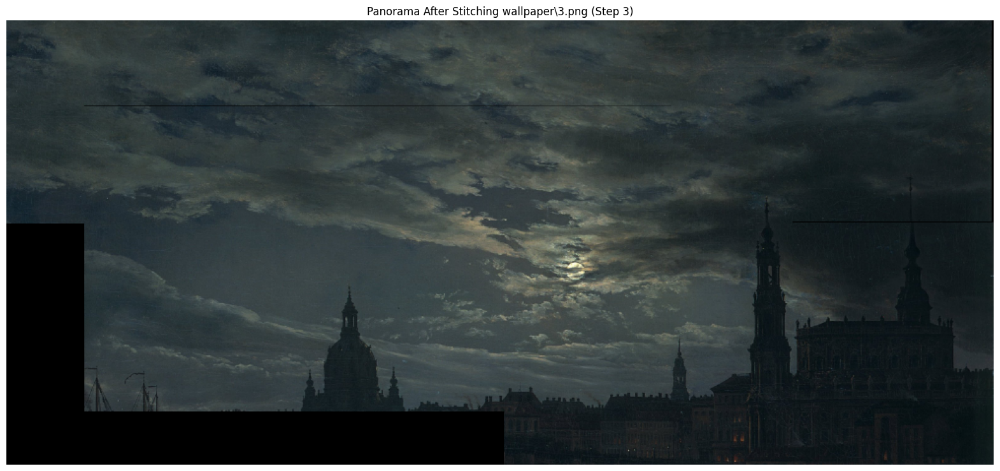


Stitching 'wallpaper\4.png' to the current panorama...
  Keypoints in current panorama: 362
  Keypoints in next image: 541
  Number of good matches found: 56


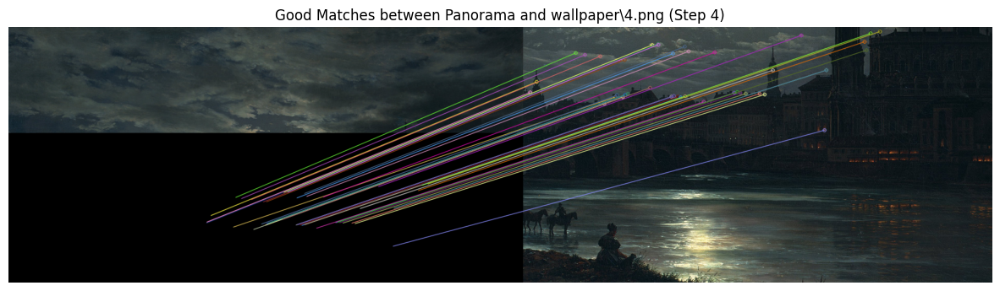

  Estimated Homography Matrix (H) for this step:
[[ 6.27504750e-01 -6.23185430e-03  3.76153182e+02]
 [-9.89689589e-04  6.23274049e-01  2.99532921e+02]
 [-4.91380086e-06 -1.06592011e-05  1.00000000e+00]]


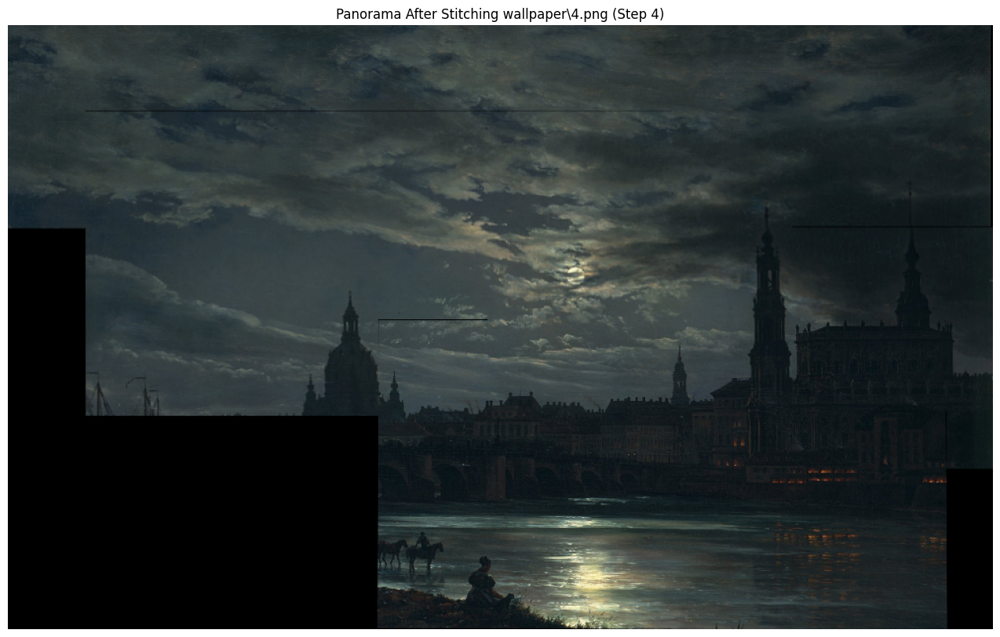


Stitching 'wallpaper\5.png' to the current panorama...
  Keypoints in current panorama: 521
  Keypoints in next image: 200
  Number of good matches found: 76


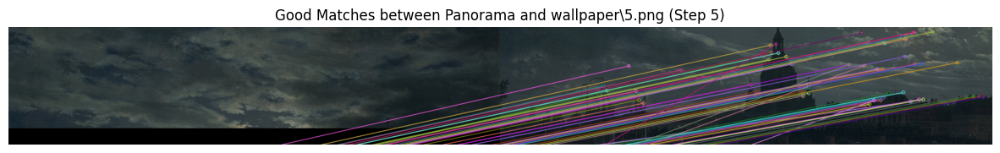

  Estimated Homography Matrix (H) for this step:
[[ 7.19553033e-01  2.14302695e-03 -5.95580781e+01]
 [-4.90160694e-04  7.20017764e-01  2.77391466e+02]
 [-2.80905850e-06  1.88116260e-06  1.00000000e+00]]


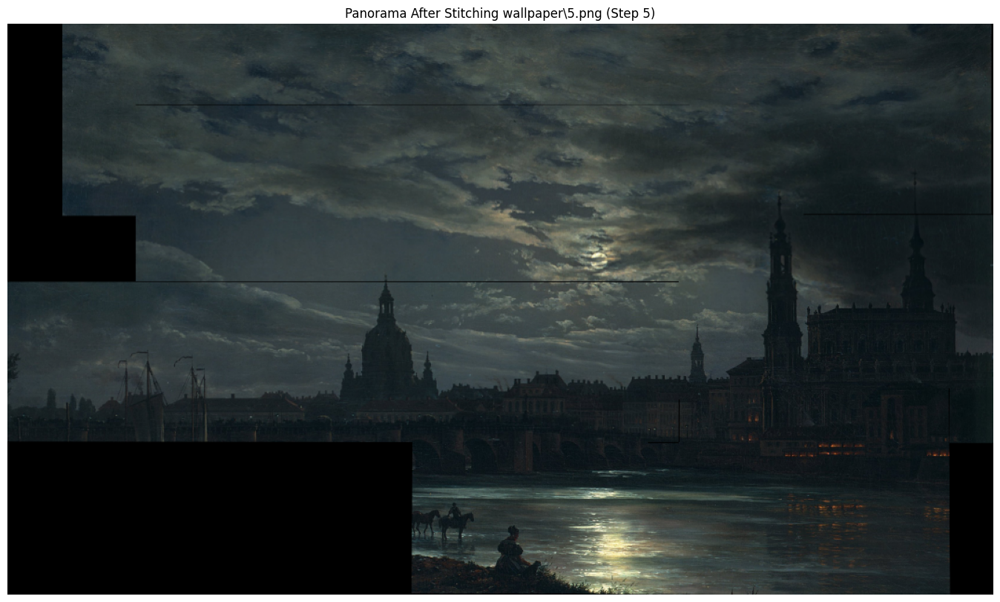

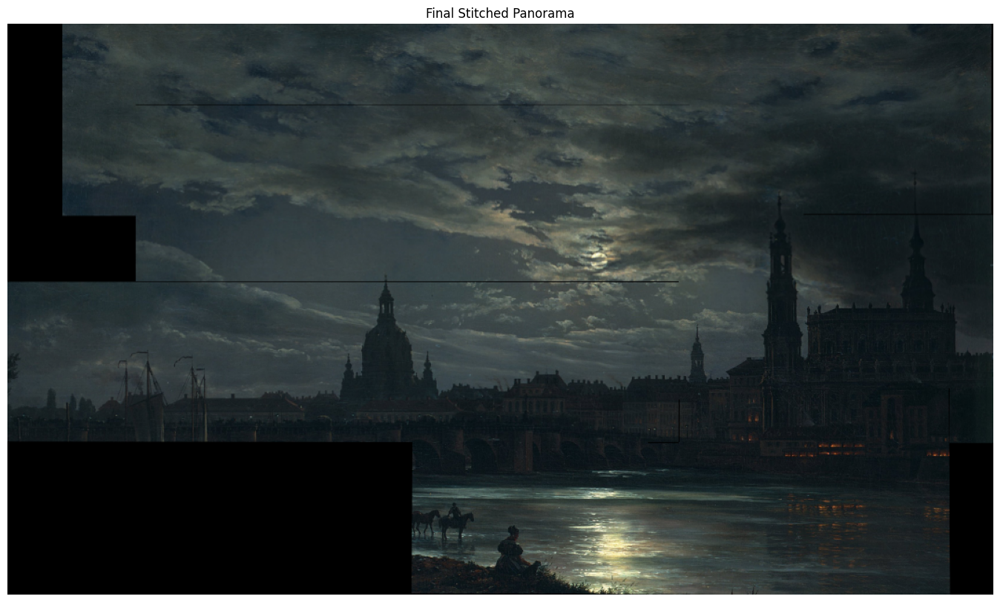

In [23]:
image_files = get_images('wallpaper')
# image_files = get_images('kable')

img_pan = stitch_multiple_images(image_files, lowe_threshold=0.7, ransac_reproj_threshold=5.0, show=True)


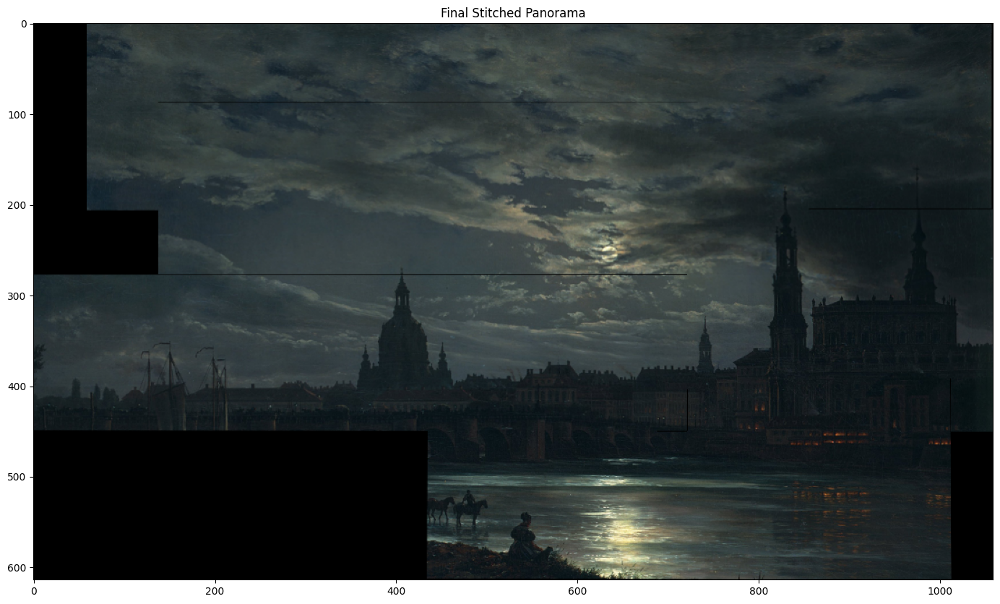

In [24]:
plt.figure(figsize=(20, 10))
plt.imshow(img_pan)
plt.title('Final Stitched Panorama')
plt.show()

# **Questão 2. Um Pouco de Teoria.**


---

## **1. Linearidade**

A propriedade de **Linearidade** afirma que $a \cdot \hat{I}_1(t) + b \cdot \hat{I}_2(t) = L(aI_1 + bI_2)$.

A convolução é uma operação linear. Usando a definição de convolução, temos:

$L(aI_1 + bI_2, t) = (g(t) * (aI_1 + bI_2))(x,y)$

Pela propriedade distributiva da convolução em relação à soma e à multiplicação por escalar:

$$\int_{R^2} g(x-s, y-r, t) \cdot (aI_1(s,r) + bI_2(s,r)) \,ds\,dr$$
$$= \int_{R^2} (a \cdot g(x-s, y-r, t) \cdot I_1(s,r) + b \cdot g(x-s, y-r, t) \cdot I_2(s,r)) \,ds\,dr$$
$$= a \int_{R^2} g(x-s, y-r, t) \cdot I_1(s,r) \,ds\,dr + b \int_{R^2} g(x-s, y-r, t) \cdot I_2(s,r) \,ds\,dr$$
$$= a \cdot (g(t) * I_1)(x,y) + b \cdot (g(t) * I_2)(x,y)$$
$$= a \cdot \hat{I}_1(t) + b \cdot \hat{I}_2(t)$$

Portanto, a propriedade de linearidade é satisfeita.

---

## **2. Invariância por Translação**

A **Invariância por Translação** afirma que $\hat{I}(x-\Delta x, y-\Delta y, t) = L(I(x-\Delta x, y-\Delta y), t)$.

Vamos considerar $I'(x,y) = I(x-\Delta x, y-\Delta y)$. 

Queremos mostrar que $(g(t) * I')(x,y) = (g(t) * I)(x-\Delta x, y-\Delta y)$.

$$(g(t) * I')(x,y) = \int_{R^2} g(x-s, y-r, t) \cdot I'(s,r) \,ds\,dr$$
$$= \int_{R^2} g(x-s, y-r, t) \cdot I(s-\Delta x, r-\Delta y) \,ds\,dr$$

Façamos uma mudança de variáveis: $u = s-\Delta x$ e $v = r-\Delta y$. 

Então $s = u+\Delta x$ e $r = v+\Delta y$, e $ds\,dr = du\,dv$.

$$= \int_{R^2} g(x-(u+\Delta x), y-(v+\Delta y), t) \cdot I(u,v) \,du\,dv$$
$$= \int_{R^2} g((x-\Delta x)-u, (y-\Delta y)-v, t) \cdot I(u,v) \,du\,dv$$
$$= (g(t) * I)(x-\Delta x, y-\Delta y)$$

Isso demonstra que a invariância por translação é satisfeita.

---

## **3. Propriedade de Semigrupo**

A **Propriedade de Semigrupo** afirma que $L(I,t+s) = L(L(I,t), s)$.

Esta propriedade é fundamental para a teoria de espaços de escala e é uma consequência da propriedade dos gaussianos de que a convolução de duas gaussianas é outra gaussiana, cujas variâncias se somam.

Seja $g(t)$ uma gaussiana com variância $t$ e $g(s)$ uma gaussiana com variância $s$.
A convolução de duas gaussianas $g_1(\sigma_1^2)$ e $g_2(\sigma_2^2)$ resulta em uma gaussiana $g_3(\sigma_1^2 + \sigma_2^2)$.

Então, $L(L(I,t), s) = g(s) * (g(t) * I)$.

Pela associatividade da convolução:
$= (g(s) * g(t)) * I$

Como a convolução de duas gaussianas com variâncias $s$ e $t$ é uma gaussiana com variância $s+t$:
$= g(s+t) * I$
$= L(I, t+s)$

Portanto, a propriedade de semigrupo é satisfeita.

---

## **4. Não Ampliação de Máximos (e Mínimos) Espaciais**

Esta propriedade está diretamente relacionada ao **Princípio do Máximo para a Equação do Calor**. A solução da equação do calor (que é equivalente à convolução com gaussianas) não pode criar novos máximos ou mínimos locais na imagem à medida que a escala $t$ aumenta.

### **(a)** **$\frac{\partial \hat{I}(x_*, y_*, t)}{\partial t} \leq 0$ se $(x_*, y_*)$ for um ponto de máximo.**

Sabemos que $\hat{I}(x,y,t)$ é a solução da equação do calor:

$$\frac{\partial \hat{I}}{\partial t} = \frac{\partial^2 \hat{I}}{\partial x^2} + \frac{\partial^2 \hat{I}}{\partial y^2} = \nabla^2 \hat{I}$$

Em um ponto de máximo local $(x_*, y_*)$, a função é côncava para baixo. Isso significa que as segundas derivadas parciais são não-positivas:

$$\frac{\partial^2 \hat{I}(x_*, y_*, t)}{\partial x^2} \leq 0$$
$$\frac{\partial^2 \hat{I}(x_*, y_*, t)}{\partial y^2} \leq 0$$

Portanto, a soma delas, que é o Laplaciano, também será não-positiva:

$$\nabla^2 \hat{I}(x_*, y_*, t) = \frac{\partial^2 \hat{I}(x_*, y_*, t)}{\partial x^2} + \frac{\partial^2 \hat{I}(x_*, y_*, t)}{\partial y^2} \leq 0$$

Assim, $\frac{\partial \hat{I}(x_*, y_*, t)}{\partial t} \leq 0$ em um ponto de máximo, o que significa que o valor do máximo não pode aumentar com o tempo (escala).

### **(b)** **$\frac{\partial \hat{I}(x_*, y_*, t)}{\partial t} \geq 0$ se $(x_*, y_*)$ for um ponto de mínimo.**

Similarmente, em um ponto de mínimo local $(x_*, y_*)$, a função é côncava para cima. Isso implica que as segundas derivadas parciais são não-negativas:
$\frac{\partial^2 \hat{I}(x_*, y_*, t)}{\partial x^2} \geq 0$
$\frac{\partial^2 \hat{I}(x_*, y_*, t)}{\partial y^2} \geq 0$

Consequentemente, o Laplaciano também será não-negativo:
$\nabla^2 \hat{I}(x_*, y_*, t) = \frac{\partial^2 \hat{I}(x_*, y_*, t)}{\partial x^2} + \frac{\partial^2 \hat{I}(x_*, y_*, t)}{\partial y^2} \geq 0$

Assim, $\frac{\partial \hat{I}(x_*, y_*, t)}{\partial t} \geq 0$ em um ponto de mínimo, o que significa que o valor do mínimo não pode diminuir com o tempo (escala).

---

## **5. Invariância por Rotação**

A **Invariância por Rotação** afirma que o espaço de escala de uma imagem rotacionada é a rotação do espaço de escala da imagem original.

A função gaussiana $g(x,y,t) = \frac{1}{2\pi t} e^{-\frac{x^2+y^2}{2t}}$ é **isotrópica**, ou seja, ela é simétrica em relação à origem e depende apenas da distância euclidiana do ponto ao centro ($r^2 = x^2+y^2$). Isso significa que a forma da gaussiana não muda com a rotação.

Seja $R_\theta$ o operador de rotação por um ângulo $\theta$.

Considere $I_R(x,y) = I(R_{-\theta}(x,y))$ como a imagem rotacionada (rotação inversa no domínio para obter o valor na posição original).

Então, $L(I_R, t) = (g(t) * I_R)(x,y) = \int_{R^2} g(x-s, y-r, t) \cdot I(R_{-\theta}(s,r)) \,ds\,dr$.

Devido à simetria radial da gaussiana, a operação de convolução com uma gaussiana preserva a simetria rotacional. Intuitivamente, se você suaviza uma imagem com um filtro que é circularmente simétrico (como a gaussiana), a suavização não introduz nenhuma preferência direcional. Portanto, se a imagem original for rotacionada e depois suavizada, o resultado será o mesmo que suavizar a imagem original e depois rotacionar o resultado.

Matematicamente, se $G$ é um filtro isotrópico (como a gaussiana), e $R$ é uma rotação:
$$R(G * I) = (R G) * (R I)$$
Como $G$ é isotrópico, $R G = G$.
Então, $$R(G * I) = G * (R I)$$.

Isso demonstra que a invariância por rotação é satisfeita.

  Insufficient good matches to estimate homography. Skipping this image.
  Insufficient good matches to estimate homography. Skipping this image.
  Insufficient good matches to estimate homography. Skipping this image.
  Insufficient good matches to estimate homography. Skipping this image.
  Insufficient good matches to estimate homography. Skipping this image.
  Insufficient good matches to estimate homography. Skipping this image.
  Insufficient good matches to estimate homography. Skipping this image.
  Insufficient good matches to estimate homography. Skipping this image.
  Insufficient good matches to estimate homography. Skipping this image.


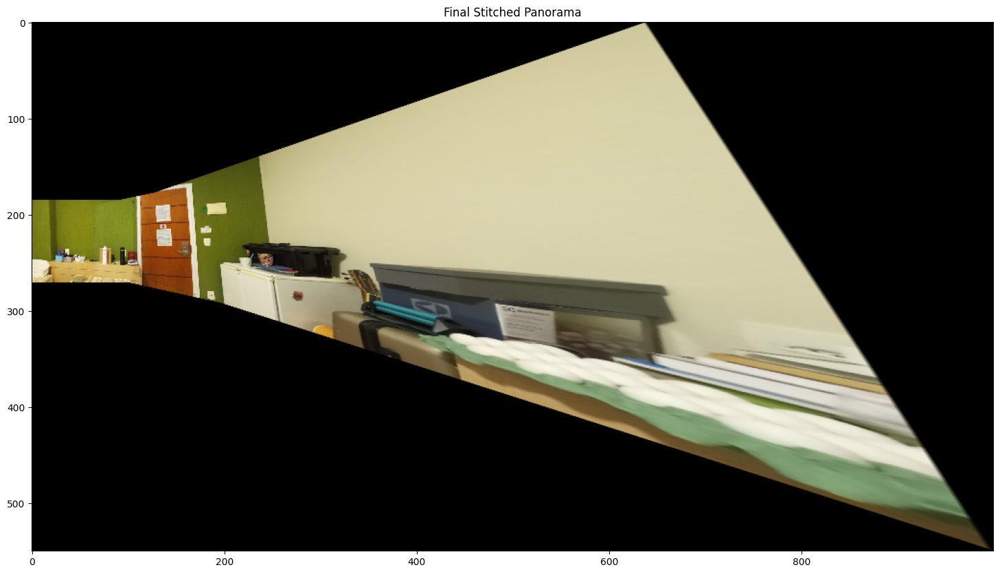

In [25]:
image_files = get_images('504-2')
image_files.sort(key=lambda x: int(os.path.splitext(os.path.basename(x))[0]))

img_pan = stitch_multiple_images(image_files, lowe_threshold=0.6, ransac_reproj_threshold=1.0, show=False)
plt.figure(figsize=(20, 10))
plt.imshow(img_pan)
plt.title('Final Stitched Panorama')
plt.show()

In [31]:
image_files = get_images('hotel')
lista_imagens = []
for path in image_files:
    lista_imagens.append(cv2.imread(path))
stitcher = cv2.Stitcher_create()  # ou cv2.createStitcher() em versões antigas
status, pano = stitcher.stitch(lista_imagens)


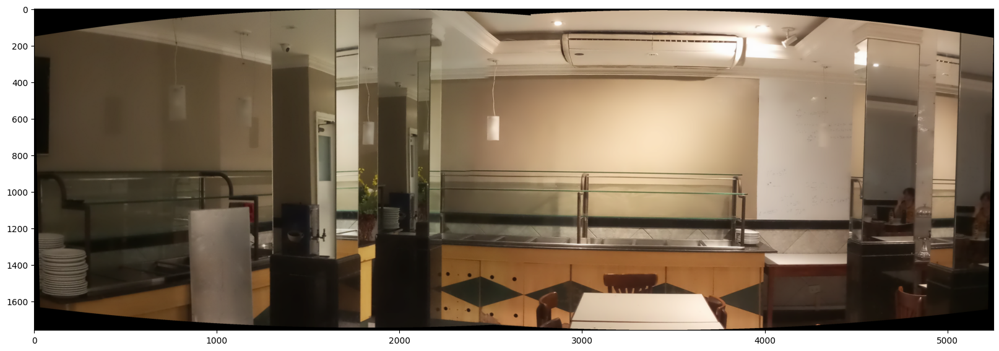

In [32]:
plt.figure(figsize=(20,10))
plt.imshow(cv2.cvtColor(pano, cv2.COLOR_BGR2RGB))
plt.show()

In [33]:
import cv2
import numpy as np

def stitch_pairwise(images, stitcher):
    while len(images) > 1:
        max_score = -1
        best_pair = None
        best_result = None

        # Try all pairs
        for i in range(len(images)):
            for j in range(i + 1, len(images)):
                imgs = [images[i], images[j]]
                status, pano = stitcher.stitch(imgs)
                if status == cv2.Stitcher_OK:
                    score = pano.shape[1]  # You can customize score (e.g., width of result)
                    if score > max_score:
                        max_score = score
                        best_pair = (i, j)
                        best_result = pano

        if best_result is None:
            print("Failed to stitch more images.")
            return images[0]  # Or return None

        i, j = best_pair
        print(f"Stitched images {i} and {j}")
        # Remove stitched images and add result
        new_images = []
        for k in range(len(images)):
            if k != i and k != j:
                new_images.append(images[k])
        new_images.append(best_result)
        images = new_images

    return images[0] if images else None


In [34]:
image_files = get_images('hotel')
lista_imagens = [cv2.imread(path) for path in image_files]
stitcher = cv2.Stitcher_create()

pano = stitch_pairwise(lista_imagens, stitcher)
if pano is not None:
    cv2.imwrite('panorama.jpg', pano)


Stitched images 4 and 6
Stitched images 2 and 3
Stitched images 2 and 3
Failed to stitch more images.
